In [34]:
# Part - 2
# 1. Import required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
df = pd.read_csv('penguins_preprocessed.csv')

In [6]:
# 2. Choose your target Y. For this dataset we will -
# Predict which gender a penguin belongs to (female or male), column ‘gender’ will be used as Y (target)

In [7]:
# 3. Create the data matrices for X (input) and Y (target) in a shape X = 𝑁 x 𝑑 and Y =
# 𝑁 x 1, were 𝑁 is a number of data samples and 𝑑 has a number of features.

# Creating the target (Y) matrix
Y = df['gender_encoded'].values.reshape(-1, 1)

# Updating the input (X) by dropping the 'gender_encoded' column
X = df.drop(columns=['gender_encoded']).values

# Display the shapes of X and Y matrices
X_shape = X.shape
Y_shape = Y.shape

X_shape, Y_shape


((305, 11), (305, 1))

In [8]:
# Here Number of sample (N) = 305 and number of features(d) = 11

In [9]:
# 4. Divide the dataset into training and test, as 80% training and 20% testing dataset.

# We will keep the split precenatge as  - (80% training, 20% testing)
split_ratio = 0.8
N = X.shape[0]

# Calculate the number of training samples
train_len = int(N * split_ratio)

# As the dataset is listed in oreder of species, we will generate shuffled indices
shuffled_indices = np.random.permutation(N)

# We will Split the indices for training and testing
train_indices = shuffled_indices[:train_len]
test_indices = shuffled_indices[train_len:]

# Now we will split the dataset
X_train = X[train_indices]
Y_train = Y[train_indices]
X_test = X[test_indices]
Y_test = Y[test_indices]


In [10]:
# 5. Print the shape of your X_train, y_train, X_test, y_test

(X_train.shape, Y_train.shape), (X_test.shape, Y_test.shape)

(((244, 11), (244, 1)), ((61, 11), (61, 1)))

In [35]:
# 6. code to define logistic regression:

class LogitRegression():
    def __init__(self, learning_rate, iterations):
        # Takes as an input hyperparameters: learning rate and the number of iterations.
        self.learning_rate = learning_rate
        self.iterations = iterations
        self.weights = None
        self.bias = None

    def sigmoid(self, z):
        #sigmoid function
        return 1 / (1 + np.exp(-z))

    def cost(self, X, y):
        # Loss function for Logistic Regression
        N = X.shape[0]
        h = self.sigmoid(np.dot(X, self.weights) + self.bias)
        cost = (1 / N) * np.sum(-y * np.log(h) - (1 - y) * np.log(1 - h))
        return cost

    def gradient_descent(self, X, y):
        N = X.shape[0]
        h = self.sigmoid(np.dot(X, self.weights) + self.bias)
        dw = (1 / N) * np.dot(X.T, (h - y))
        db = (1 / N) * np.sum(h - y)
        
        # Update the weights and bias using the gradient descent rule
        self.weights -= self.learning_rate * dw
        self.bias -= self.learning_rate * db

    def fit(self, X, y):
        # Initializing the weights and bias
        N, d = X.shape
        self.weights = np.random.uniform(0, 1,(d, 1))
        self.bias = 0
        self.loss = []

        # Performing the training process with gradient descent
        for i in range(self.iterations):
            self.gradient_descent(X, y)
            cost_value = self.cost(X, y)
            self.loss.append(cost_value)

            #if i % 1000 == 0:
                #print(f"Iteration {i}, Cost: {cost_value}")

    def predict(self, X):
        # Prediction of the binary output based on the trained model
        linear_model = np.dot(X, self.weights) + self.bias
        y_hat = self.sigmoid(linear_model)
        y_pred = np.where(y_hat >= 0.5, 1, 0)
        return y_pred
    
    def plot_loss_fxn(model):
        iterations = list(range(1, len(model.loss) + 1))
        loss_values = model.loss

        plt.figure(figsize=(8, 6))
        plt.plot(iterations, loss_values, label='Loss', color='blue')
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.title('Loss Curve Over Iterations')
        plt.grid(True)
        plt.legend()
        plt.show()

        # Printing loss values over each iteration
        for i, loss in enumerate(loss_values):
            print(f"Iteration {i + 1}: Loss = {loss}")

In [36]:
# Counting correct/incorrect predictions in our model to define accuracy
# Defining a function to calulate the accuracy

def accuracy(y_true, y_pred):
    #y_true = np.array(y_true)
    #y_pred = np.array(y_pred)
    
    # Calculate the total number of correct predictions
    correct_predictions = np.sum(y_true == y_pred)
    
    # Calculate accuracy as a percentage
    accuracy = correct_predictions / len(y_true) * 100
    
    return accuracy

In [38]:
#7. Training the model
# Calling LogitRegression class to define a model

model = LogitRegression(learning_rate=1e-3, iterations=100000)

# Training the model using the training dataset by calling the fit function
model.fit(X_train, Y_train)

# Make predictions on the test set
pred = model.predict(X_test)

# Calculate accuracy
acc = accuracy(Y_test, pred)
print(f"Accuracy: {acc:.2f}%")

Accuracy: 88.52%


In [39]:
# Test Case 1
model1 = LogitRegression(learning_rate=1e-3, iterations=50000)
model1.fit(X_train, Y_train)
pred1 = model1.predict(X_test)
acc1 = accuracy(Y_test, pred1)
print(f"Test case 1 - Accuracy: {acc1:.2f}%")

# Test Case 2
model2 = LogitRegression(learning_rate=1e-4, iterations=100000)
model2.fit(X_train, Y_train)
pred2 = model2.predict(X_test)
acc2 = accuracy(Y_test, pred2)
print(f"Test case 2 - Accuracy: {acc2:.2f}%")

# Test Case 3
model3 = LogitRegression(learning_rate=5e-3, iterations=200000)
model3.fit(X_train, Y_train)
pred3 = model3.predict(X_test)
acc3 = accuracy(Y_test, pred3)
print(f"Test case 3 - Accuracy: {acc3:.2f}%")


Test case 1 - Accuracy: 83.61%
Test case 2 - Accuracy: 52.46%
Test case 3 - Accuracy: 95.08%


In [41]:
#8. Saving the weights of the model3 as it has the highest accuracy
import pickle

model_weights = {
    "weights": model3.weights, 
    "bias": model3.bias         
}

with open("gsingh55_smituple_assignment1_part2.pickle", "wb") as file:
    pickle.dump(model_weights, file)

In [ ]:
# 9. We have already defined a function named 'accuracy' above to calculate accuracy.
# on test dataset by counting how many correct/incorrect predictions

In [42]:
# Open the .pickle file in read-binary mode
with open('gsingh55_smituple_assignment1_part2.pickle', 'rb') as file:
    # Load the content of the file
    model = pickle.load(file)

# View or inspect the loaded model
print(model)


{'weights': array([[ 6.64697024],
       [ 6.89414203],
       [ 3.34376214],
       [ 9.53386293],
       [-0.50444484],
       [ 0.47830953],
       [-2.75910959],
       [-3.67112212],
       [-2.41450666],
       [-1.79075275],
       [-2.40446805]]), 'bias': np.float64(-7.597730665329686)}


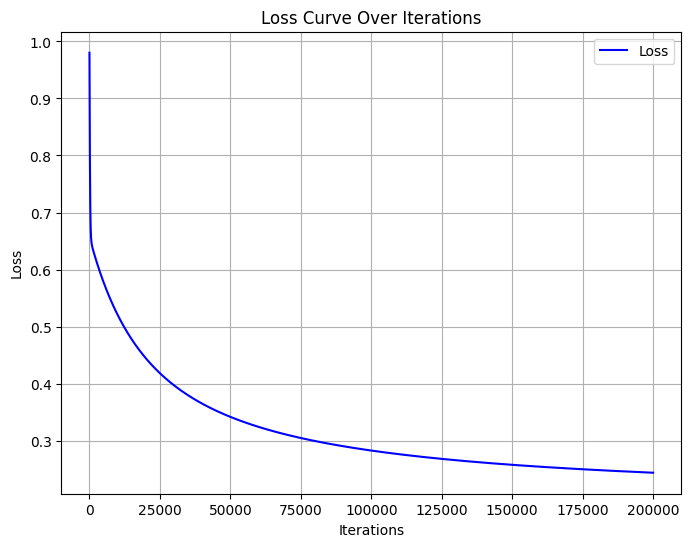

Iteration 1: Loss = 0.9801985386573335
Iteration 2: Loss = 0.9786547287950195
Iteration 3: Loss = 0.9771156919087817
Iteration 4: Loss = 0.9755814298278243
Iteration 5: Loss = 0.9740519442817736
Iteration 6: Loss = 0.9725272369004985
Iteration 7: Loss = 0.9710073092139379
Iteration 8: Loss = 0.9694921626519346
Iteration 9: Loss = 0.9679817985440795
Iteration 10: Loss = 0.9664762181195637
Iteration 11: Loss = 0.964975422507038
Iteration 12: Loss = 0.9634794127344815
Iteration 13: Loss = 0.9619881897290781
Iteration 14: Loss = 0.9605017543171016
Iteration 15: Loss = 0.9590201072238091
Iteration 16: Loss = 0.957543249073343
Iteration 17: Loss = 0.9560711803886413
Iteration 18: Loss = 0.9546039015913558
Iteration 19: Loss = 0.9531414130017802
Iteration 20: Loss = 0.9516837148387851
Iteration 21: Loss = 0.9502308072197623
Iteration 22: Loss = 0.9487826901605783
Iteration 23: Loss = 0.9473393635755335
Iteration 24: Loss = 0.9459008272773347
Iteration 25: Loss = 0.9444670809770715
Iteration 2

In [44]:
#10. Plotting the loss graph and printing out the loss values.
# we have already defined a function named 'plot_loss_fxn' to plot the loss curve

model3.plot_loss_fxn()

In [190]:
#References : 
# https://seaborn.pydata.org/tutorial/function_overview.html
# https://en.wikipedia.org/wiki/Sigmoid_function
# https://en.wikipedia.org/wiki/Gradient_descent
# https://matplotlib.org/stable/users/index.html
# https://www.oreilly.com/library/view/python-for-data/9781449323592/ch04.html